#### Install required packages

In [5]:
! pip install  numpy ydata-profiling ipywidgets --quiet

#### Import necessary libraries

In [1]:
from ydata_profiling import ProfileReport
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

### EDA for Credit Card Fraud Dataset

In [3]:
# Load data
creditcard_data = pd.read_csv('CreditCard_ExamData.csv')

# Basic info
print("Shape of dataset:", creditcard_data.shape)
print("Data Types:\n", creditcard_data.dtypes)
print("Missing Values:\n", creditcard_data.isnull().sum())

# Preview data
display(creditcard_data.head())

Shape of dataset: (463099, 24)
Data Types:
 ID                         int64
cc_num                   float64
account_status            object
merchant                  object
category                  object
amt                      float64
first                     object
last                      object
gender                    object
street                    object
city                      object
state                     object
zip                        int64
lat                      float64
long                     float64
city_pop                   int64
job                       object
dob                       object
trans_num                 object
merch_lat                float64
merch_long               float64
is_fraud                   int64
trans_time                object
time_since_last_trans    float64
dtype: object
Missing Values:
 ID                         0
cc_num                     0
account_status             0
merchant                   0
category         

,ID,cc_num,account_status,merchant,category,amt,first,last,gender,street,...,long,city_pop,job,dob,trans_num,merch_lat,merch_long,is_fraud,trans_time,time_since_last_trans
0,0,6.011682e+15,active,"Reichert, Huels and Hoppe",shopping_net,8.06,Kaitlyn,Newman,F,098 Stewart Hill,...,-87.4581,70,Prison officer,22-06-1956,a5889defcd83dc0bfd1322ea6f638e1e,36.062791,-88.255637,0,10:03:51,55.643889
1,1,4.005677e+15,active,Zemlak Group,misc_net,284.00,William,Perry,M,458 Phillips Island Apt. 768,...,-90.9027,71335,Herbalist,31-05-1994,d61dcd4915a275c2e72c1cee53ef6a6a,30.677907,-90.941823,0,10:58:07,3.615833
2,2,3.502089e+15,active,Brown-Greenholt,entertainment,4.28,Scott,Martin,M,31472 Cody Place Suite 740,...,-77.0793,19054,Operations geologist,08-09-1976,d265b0fa75d886774fd648e1501c0f5d,39.259093,-77.911542,0,12:29:00,6.857222
3,3,4.412721e+15,active,Larkin Ltd,kids_pets,174.71,Richard,Marshall,M,295 Page Creek Suite 181,...,-75.6664,776,Psychiatrist,17-11-1949,57af3bdfc5c03c666c893119581e155e,37.904112,-76.392739,0,23:45:48,34.482500
4,4,1.800470e+14,active,"Okuneva, Schneider and Rau",shopping_pos,6.35,Jared,Camacho,M,4257 Perez Mall,...,-81.3739,192805,Building control surveyor,30-06-1963,14c6ad9d16dd592df416bcb4c05c4fc8,41.622070,-82.321965,0,02:59:08,28.084167


In [4]:
# Summary statistics
display(creditcard_data.describe(include='all'))

,ID,cc_num,account_status,merchant,category,amt,first,last,gender,street,...,long,city_pop,job,dob,trans_num,merch_lat,merch_long,is_fraud,trans_time,time_since_last_trans
count,463099.000000,4.630990e+05,463099,463099,463099,463099.000000,463099,463099,463099,463099,...,463099.000000,4.630990e+05,463099,463099,463099,463099.000000,463099.000000,463099.000000,463099,462104.000000
unique,NaN,NaN,4,693,14,NaN,355,486,2,995,...,NaN,NaN,496,980,463099,NaN,NaN,NaN,85684,NaN
top,NaN,NaN,active,Kilback LLC,gas_transport,NaN,Christopher,Smith,F,27479 Reeves Dale,...,NaN,NaN,Film/video editor,23-03-1977,b3050698c443a5abd5814526d032eda1,NaN,NaN,NaN,15:49:29,NaN
freq,NaN,NaN,451550,1566,47112,NaN,9515,10194,253510,1154,...,NaN,NaN,3530,1964,1,NaN,NaN,NaN,19,NaN
mean,231549.000000,4.166531e+17,NaN,NaN,NaN,69.375755,NaN,NaN,NaN,NaN,...,-90.219026,8.846797e+04,NaN,NaN,NaN,38.531106,-90.220038,0.005094,NaN,34.276062
std,133685.310493,1.307773e+18,NaN,NaN,NaN,147.340624,NaN,NaN,NaN,NaN,...,13.762365,3.008918e+05,NaN,NaN,NaN,5.106399,13.774562,0.071190,NaN,48.192418
min,0.000000,6.041621e+10,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,...,-165.672300,2.300000e+01,NaN,NaN,NaN,19.027849,-166.671242,0.000000,NaN,0.000000
25%,115774.500000,1.800430e+14,NaN,NaN,NaN,9.620000,NaN,NaN,NaN,NaN,...,-96.798000,7.430000e+02,NaN,NaN,NaN,34.727694,-96.910047,0.000000,NaN,6.668264
50%,231549.000000,3.521417e+15,NaN,NaN,NaN,47.340000,NaN,NaN,NaN,NaN,...,-87.461600,2.443000e+03,NaN,NaN,NaN,39.363202,-87.420156,0.000000,NaN,18.701111
75%,347323.500000,4.642255e+15,NaN,NaN,NaN,82.770000,NaN,NaN,NaN,NaN,...,-80.158000,2.032800e+04,NaN,NaN,NaN,41.958071,-80.216326,0.000000,NaN,42.570347


Text(0.5, 1.0, 'Transaction Amount Distribution')

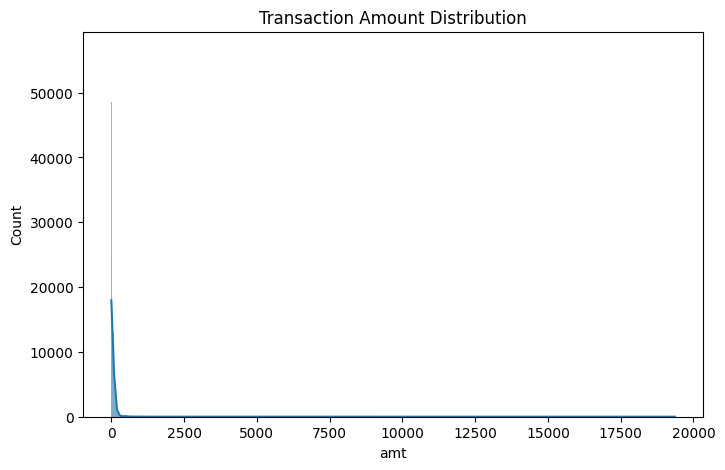

In [5]:

%matplotlib inline
# Distribution of transaction amount
plt.figure(figsize=(8,5))
sns.histplot(creditcard_data['amt'], bins=5000, kde=True)
plt.title('Transaction Amount Distribution')

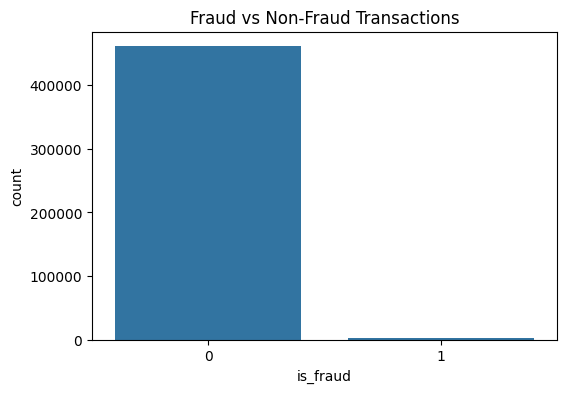

In [6]:

# Fraud vs Non-Fraud count
plt.figure(figsize=(6,4))
sns.countplot(x='is_fraud', data=creditcard_data)
plt.title('Fraud vs Non-Fraud Transactions')
plt.show()

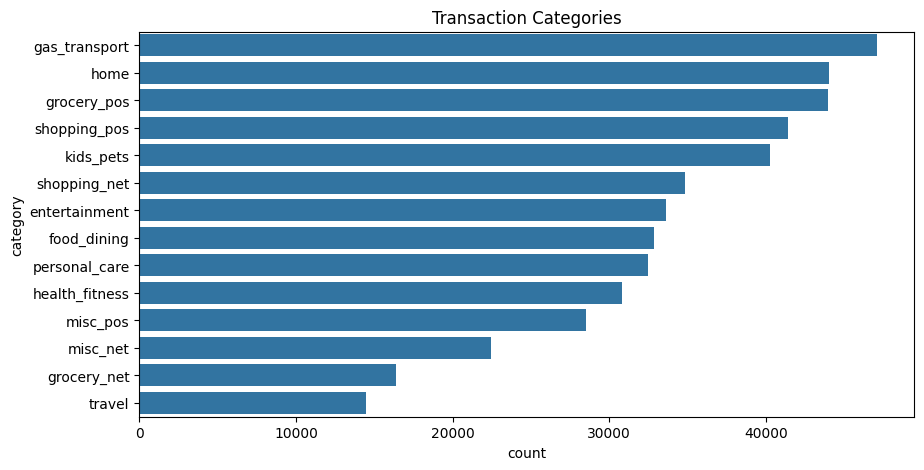

In [7]:
# Category distribution
plt.figure(figsize=(10,5))
sns.countplot(y='category', data=creditcard_data, order=creditcard_data['category'].value_counts().index)
plt.title('Transaction Categories')
plt.show()


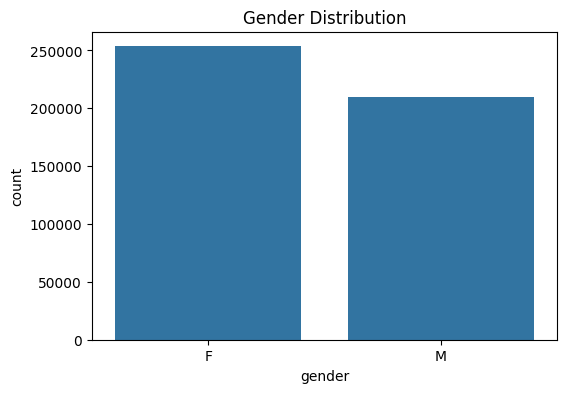

In [8]:

# Gender distribution
plt.figure(figsize=(6,4))
sns.countplot(x='gender', data=creditcard_data)
plt.title('Gender Distribution')
plt.show()

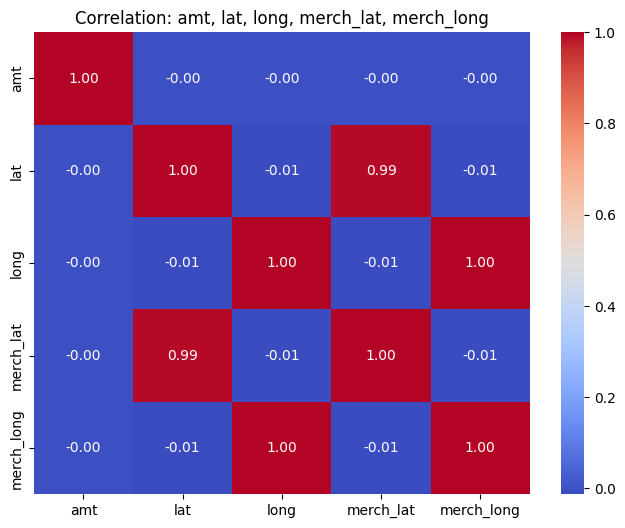

In [11]:
# Select only the relevant columns
corr_cols = ['amt', 'lat', 'long', 'merch_lat', 'merch_long']
corr_matrix = creditcard_data[corr_cols].corr()

# Plot correlation heatmap
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation: amt, lat, long, merch_lat, merch_long')
plt.show()

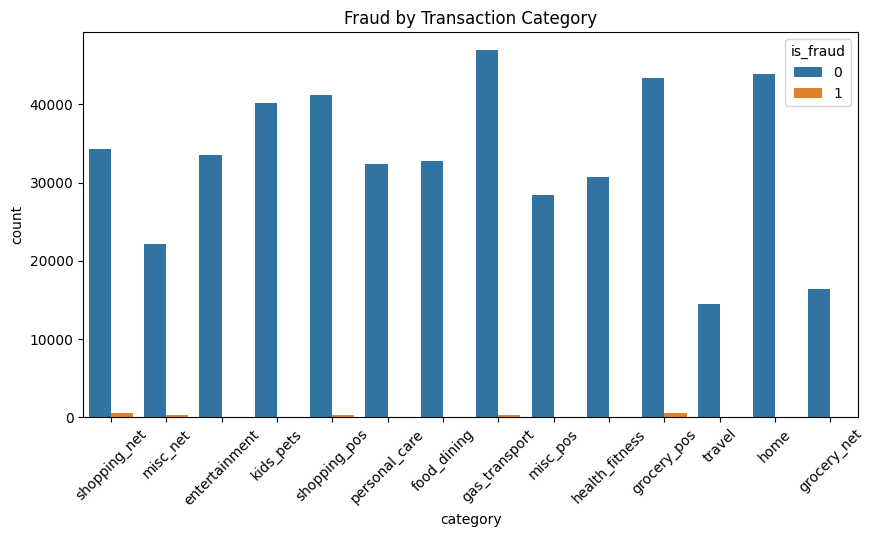

In [12]:
# Fraud by category
plt.figure(figsize=(10,5))
sns.countplot(x='category', hue='is_fraud', data=creditcard_data)
plt.title('Fraud by Transaction Category')
plt.xticks(rotation=45)
plt.show()

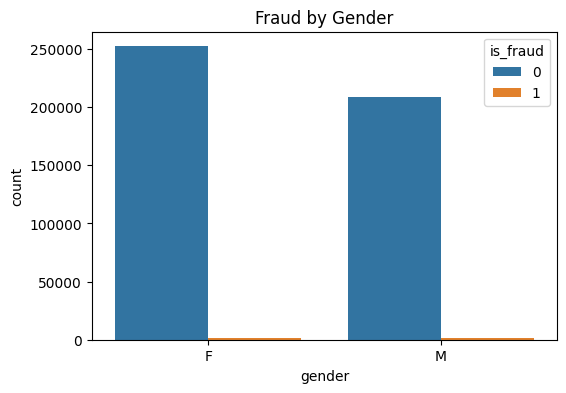

In [13]:
# Fraud by gender
plt.figure(figsize=(6,4))
sns.countplot(x='gender', hue='is_fraud', data=creditcard_data)
plt.title('Fraud by Gender')
plt.show()


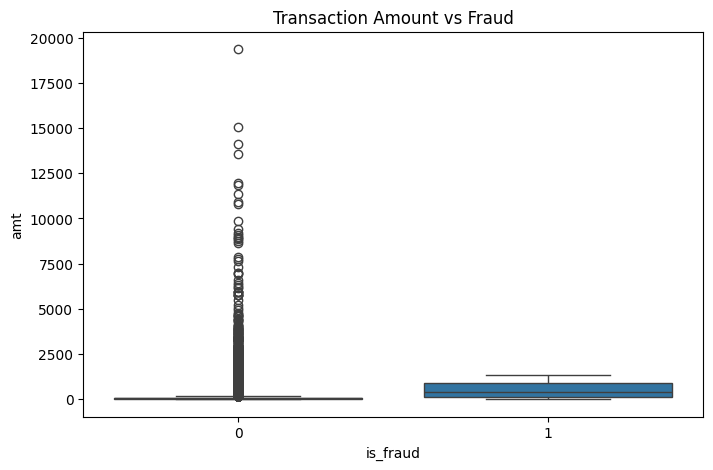

In [14]:
# Fraud by transaction amount (boxplot)
plt.figure(figsize=(8,5))
sns.boxplot(x='is_fraud', y='amt', data=creditcard_data)
plt.title('Transaction Amount vs Fraud')
plt.show()

In [15]:
from ydata_profiling import ProfileReport
import pandas as pd
creditcard_data = pd.read_csv('CreditCard_ExamData.csv')
profile = ProfileReport(creditcard_data, title="Credit Card Data Report", explorative=True)

In [16]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 24/24 [00:43<00:00,  1.82s/it]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]